# Load Data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
msn11= pd.read_csv('msn_11_fuel_leak_signals_preprocessed.csv', sep=";")

### Summary of MSN  11

In [5]:
msn11.head()

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,VALUE_FUEL_QTY_CT,VALUE_FUEL_QTY_FT1,VALUE_FUEL_QTY_FT2,VALUE_FUEL_QTY_FT3,VALUE_FUEL_QTY_FT4,VALUE_FUEL_QTY_LXT,VALUE_FUEL_QTY_RXT,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,MSN
0,2014-08-20 09:03:07,NaN,NaN,NaN,-35.0,29946.0,0.0,1921.0,2659.0,2586.0,1921.0,10407.0,10452.0,2.0,NaN,0.0,F-RBAD
1,2014-08-20 09:03:08,NaN,NaN,NaN,-36.0,29945.0,0.0,1921.0,2659.0,2586.0,1921.0,10407.0,10453.0,2.0,NaN,0.0,F-RBAD
2,2014-08-20 09:03:09,NaN,NaN,NaN,-36.0,29945.0,0.0,1921.0,2659.0,2585.0,1921.0,10407.0,10453.0,2.0,NaN,0.0,F-RBAD
3,2014-08-20 09:03:10,NaN,NaN,NaN,-35.0,29944.0,0.0,1921.0,2659.0,2585.0,1921.0,10408.0,10453.0,2.0,NaN,0.0,F-RBAD
4,2014-08-20 09:03:11,NaN,NaN,NaN,-36.0,29942.0,0.0,1921.0,2658.0,2584.0,1921.0,10408.0,10453.0,2.0,NaN,0.0,F-RBAD


In [6]:
data1 = {}
data1['Features'] = list(msn11.columns)
data1['msn02'] = list(msn11.isnull().sum())
data1['msn02_%'] = [round(x/msn11.shape[0]*100, 2) for x in list(msn11.isnull().sum())]
data1['n_unique'] = list(msn11.nunique())

df = pd.DataFrame(data1)
df

,Features,msn02,msn02_%,n_unique
0,UTC_TIME,0,0.00,4455992
1,FUEL_USED_2,4131081,92.71,79193
2,FUEL_USED_3,4139824,92.90,74411
3,FUEL_USED_4,4164851,93.47,61768
4,FW_GEO_ALTITUDE,300327,6.74,36757
5,VALUE_FOB,300327,6.74,51763
6,VALUE_FUEL_QTY_CT,300327,6.74,11490
7,VALUE_FUEL_QTY_FT1,300327,6.74,1805
8,VALUE_FUEL_QTY_FT2,300327,6.74,2238
9,VALUE_FUEL_QTY_FT3,300327,6.74,2201


### Working with its Columns

In [8]:
# Convert 'UTC_TIME' to datetime
msn11['UTC_TIME'] = pd.to_datetime(msn11['UTC_TIME'])

# Create new columns for date and time
msn11['DATE'] = msn11['UTC_TIME'].dt.date
msn11['TIME'] = msn11['UTC_TIME'].dt.time

# Display the DataFrame to verify the changes
print(msn11[['UTC_TIME', 'DATE', 'TIME']].head())

             UTC_TIME        DATE      TIME
0 2014-08-20 09:03:07  2014-08-20  09:03:07
1 2014-08-20 09:03:08  2014-08-20  09:03:08
2 2014-08-20 09:03:09  2014-08-20  09:03:09
3 2014-08-20 09:03:10  2014-08-20  09:03:10
4 2014-08-20 09:03:11  2014-08-20  09:03:11


In [9]:
# Filter msn02 dataset for rows where FLIGHT_PHASE_COUNT == 8
msn11 = msn11[msn11['FLIGHT_PHASE_COUNT'] == 8]

# Display the filtered DataFrame to verify the changes
msn11.head()

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,VALUE_FUEL_QTY_CT,VALUE_FUEL_QTY_FT1,VALUE_FUEL_QTY_FT2,VALUE_FUEL_QTY_FT3,VALUE_FUEL_QTY_FT4,VALUE_FUEL_QTY_LXT,VALUE_FUEL_QTY_RXT,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,MSN,DATE,TIME
1148,2014-08-20 09:22:15,NaN,NaN,NaN,1464.0,29174.0,0.0,1762.0,2510.0,2416.0,1788.0,10473.0,10226.0,8.0,NaN,0.0,F-RBAD,2014-08-20,09:22:15
1149,2014-08-20 09:22:16,NaN,NaN,NaN,1498.0,29172.0,0.0,1761.0,2507.0,2419.0,1791.0,10470.0,10227.0,8.0,NaN,0.0,F-RBAD,2014-08-20,09:22:16
1150,2014-08-20 09:22:17,NaN,NaN,NaN,1535.0,29162.0,0.0,1759.0,2507.0,2420.0,1791.0,10464.0,10228.0,8.0,NaN,0.0,F-RBAD,2014-08-20,09:22:17
1151,2014-08-20 09:22:18,NaN,NaN,NaN,1572.0,29158.0,0.0,1759.0,2504.0,2421.0,1792.0,10460.0,10226.0,8.0,NaN,0.0,F-RBAD,2014-08-20,09:22:18
1152,2014-08-20 09:22:19,NaN,NaN,NaN,1611.0,29160.0,0.0,1758.0,2504.0,2422.0,1793.0,10461.0,10224.0,8.0,NaN,0.0,F-RBAD,2014-08-20,09:22:19


In [10]:
# Check if there are any duplicates in the UTC_TIME column
has_duplicates = msn11.duplicated(['UTC_TIME']).any()

# Print the result
print("Are there any duplicates in the UTC_TIME column?", has_duplicates)

Are there any duplicates in the UTC_TIME column? False


### Creating FUEL_USED_TOTAL COLUMN

In [11]:
msn11['FUEL_USED_TOTAL'] = msn11['FUEL_USED_1'] + msn11['FUEL_USED_2'] + msn11['FUEL_USED_3'] + msn11['FUEL_USED_4']

In [13]:
msn11['VALUE_FOB'].isna().sum()

0

### Creating a graph for VALUE_FOB in MSN 11

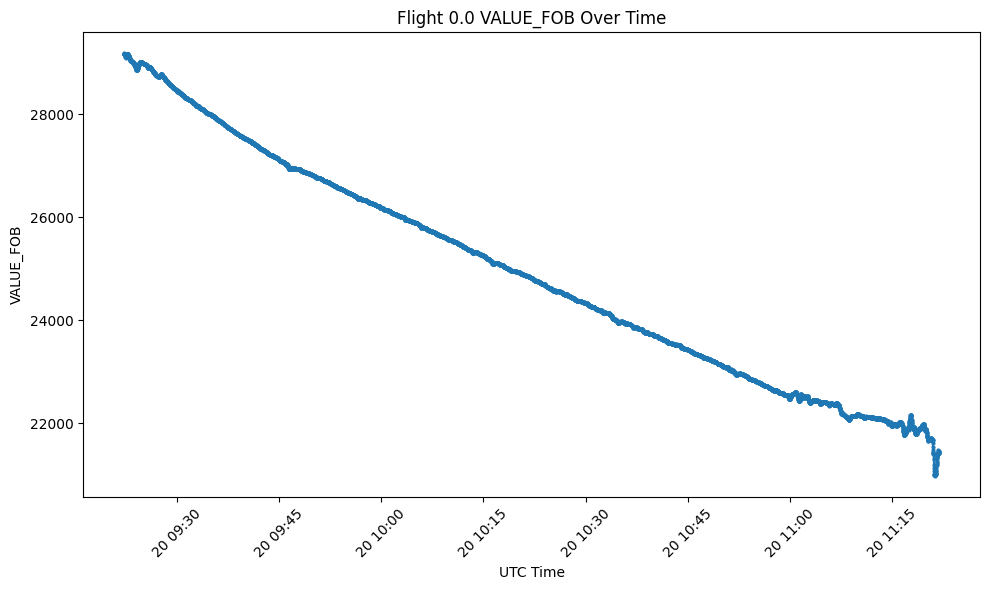

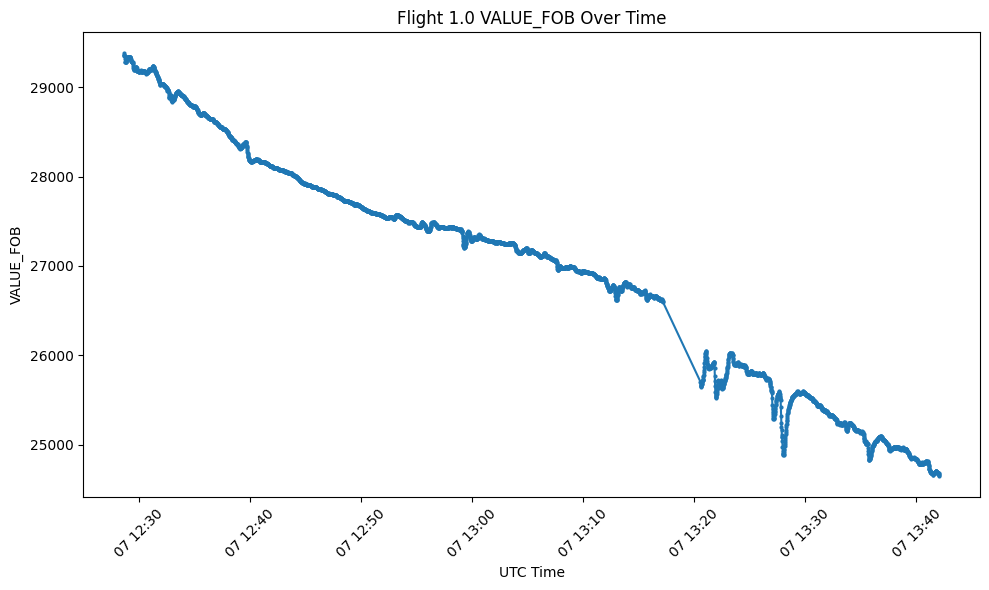

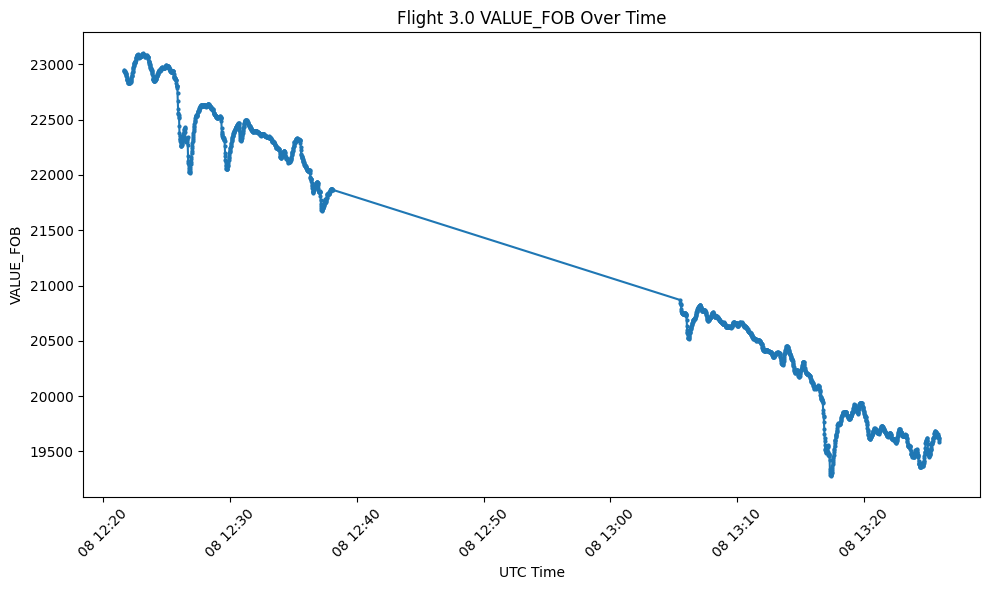

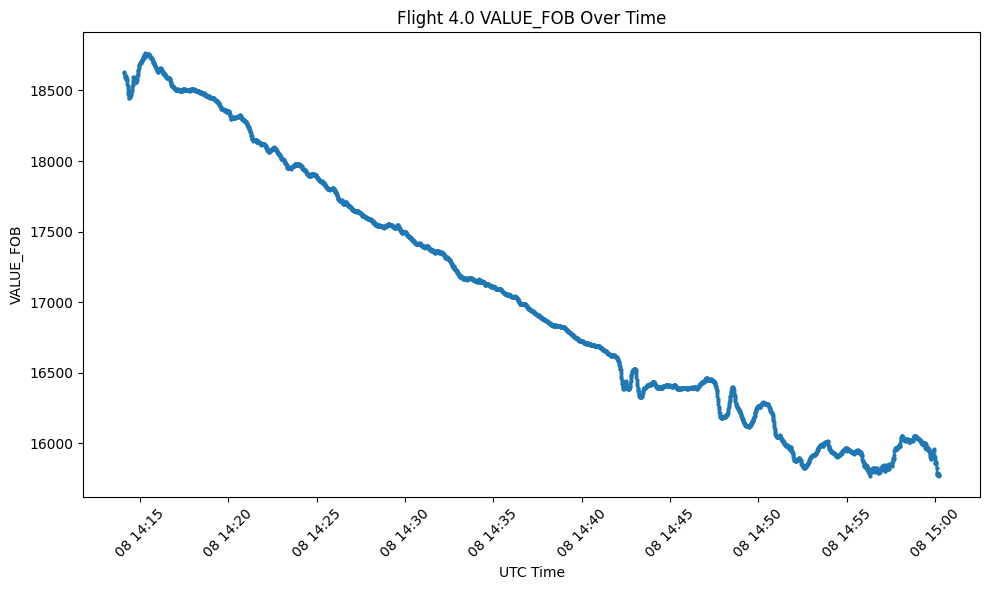

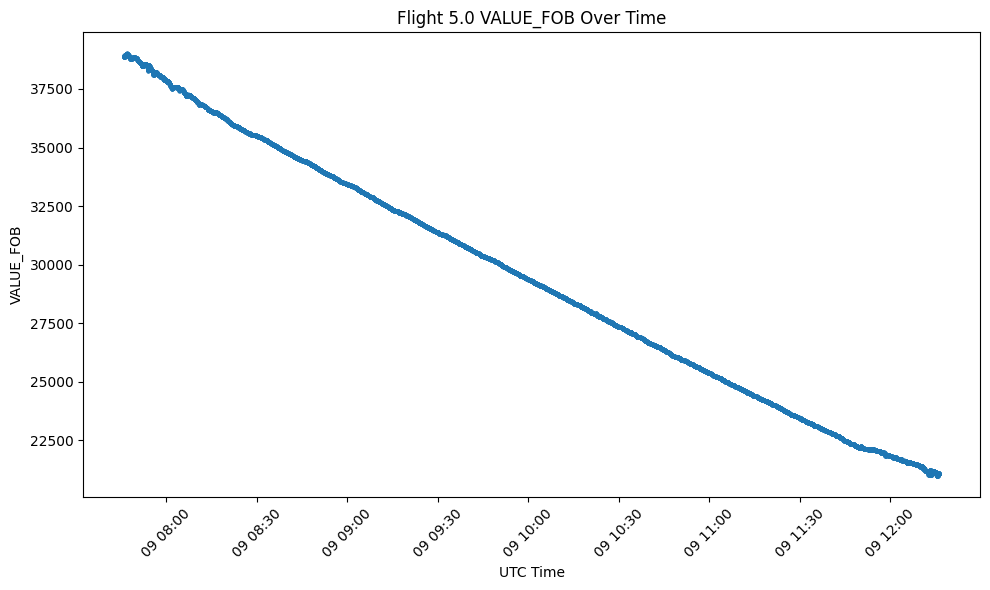

...

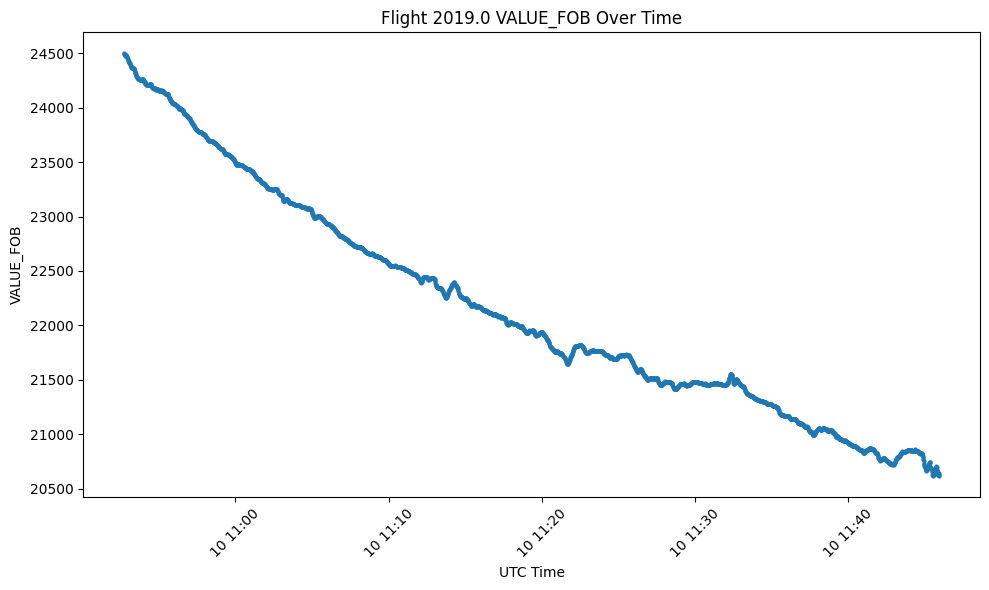

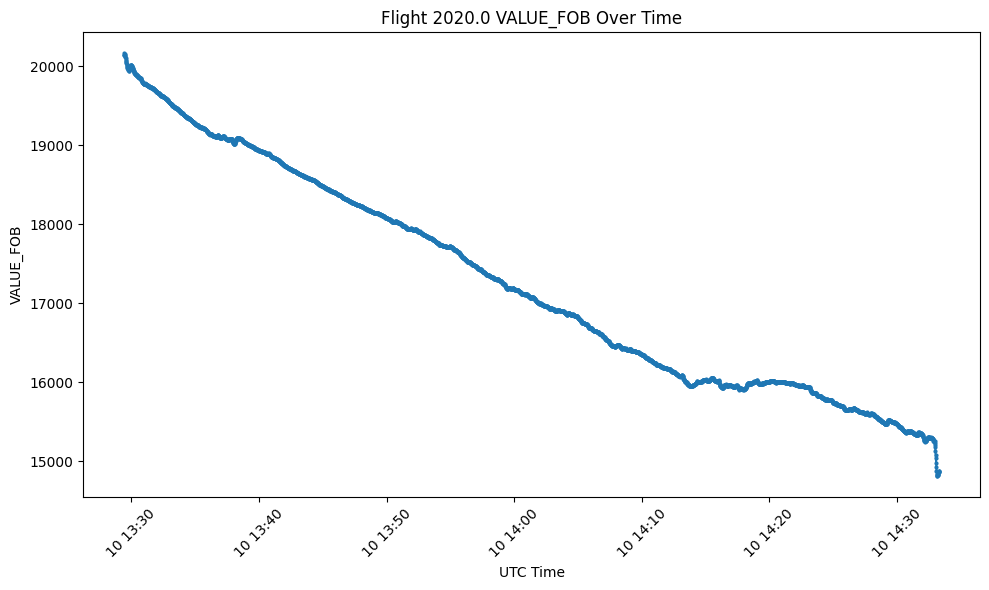

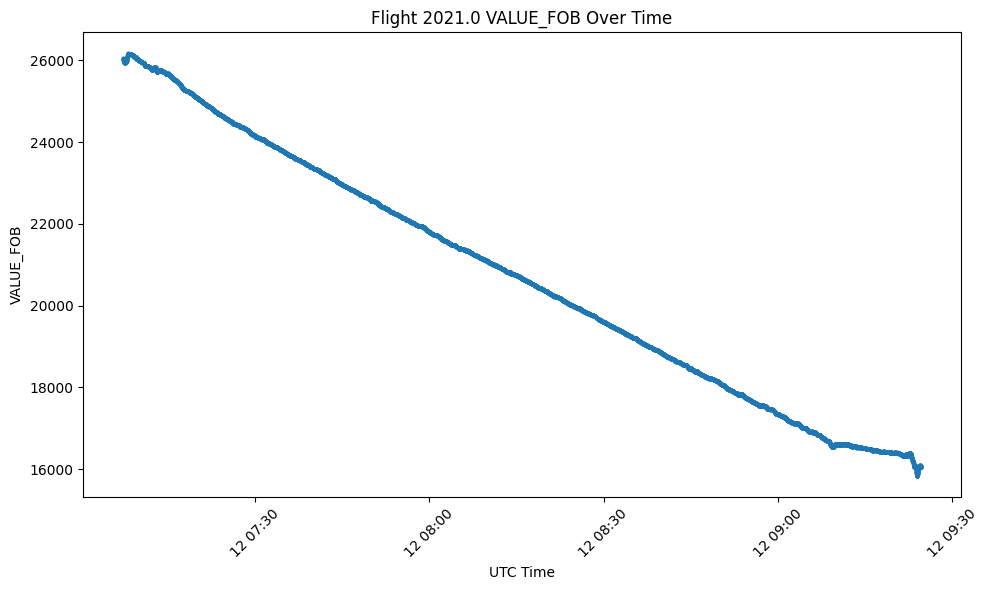

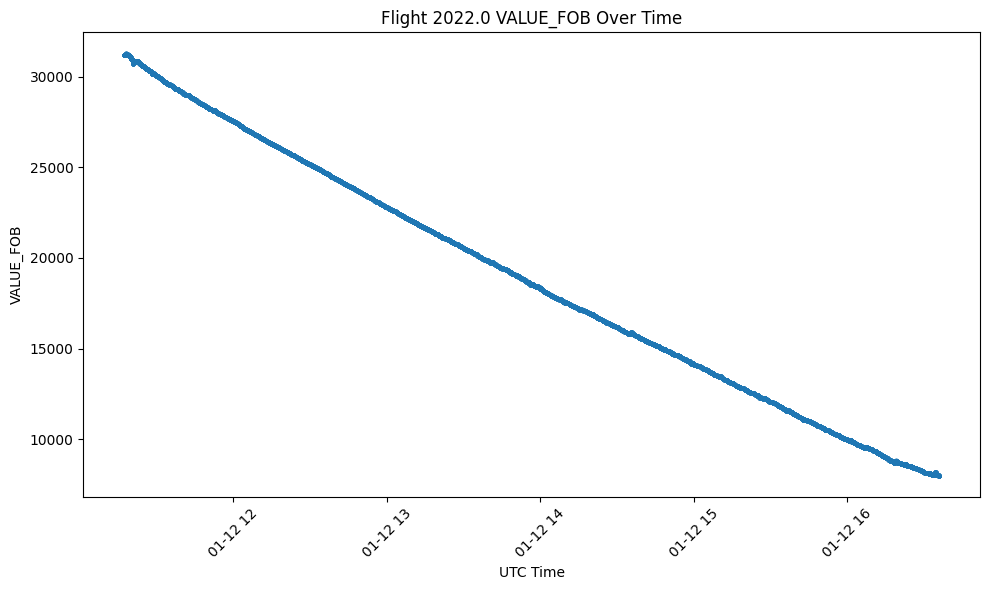

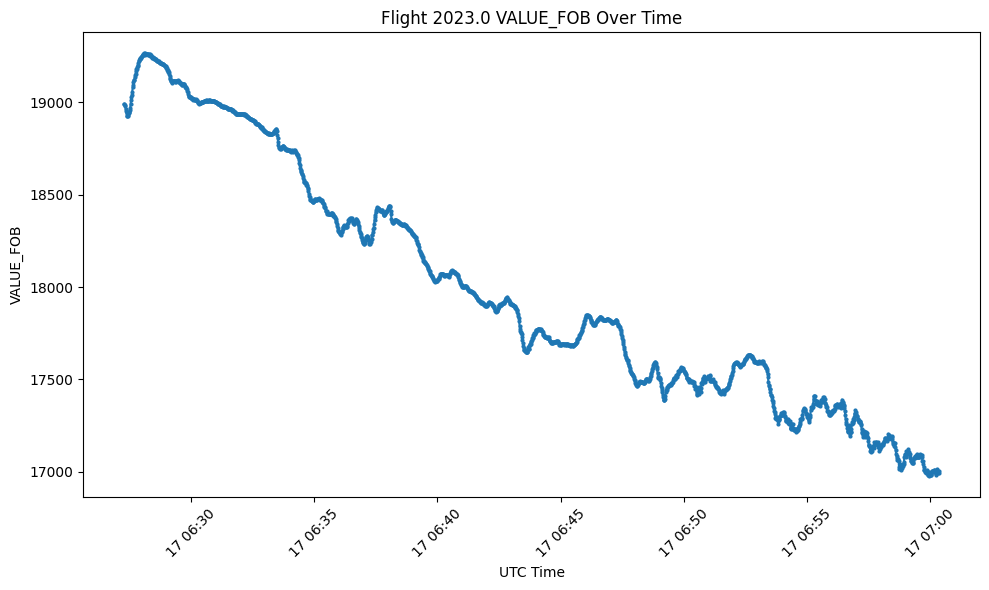

In [12]:
import matplotlib.pyplot as plt

# Assuming 'msn37' DataFrame is already loaded and preprocessed

# Unique flights
flights = msn11['Flight'].unique()

# Plot each flight's VALUE_FOB over time
for flight in flights:
    # Filter data for the current flight
    flight_data = msn11[msn11['Flight'] == flight]
    
    # Create a new figure for each flight
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    
    # Plot VALUE_FOB over UTC_TIME
    plt.plot(flight_data['UTC_TIME'], flight_data['VALUE_FOB'], marker='o', linestyle='-', markersize=2)
    plt.title(f'Flight {flight} VALUE_FOB Over Time')
    plt.xlabel('UTC Time')
    plt.ylabel('VALUE_FOB')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Show plot
    plt.show()


In [15]:
from scipy.stats import linregress
import pandas as pd

# List of specific flights to calculate the slope for
flights_to_analyze = [5.0, 6.0, 15.0, 16.0, 17.0, 18.0, 29.0, 31.0, 32.0, 96.0]

# Initialize a dictionary to hold the slope for each flight
slopes = {}

for flight in flights_to_analyze:
    # Filter the DataFrame for the current flight
    flight_data = msn11[msn11['Flight'] == flight]
    
    # Convert 'UTC_TIME' to numeric for regression analysis
    x = pd.to_numeric(flight_data['UTC_TIME'].astype(np.int64))  # Convert datetime to int64 for the calculation
    y = flight_data['VALUE_FOB']
    
    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    
    # Store the slope
    slopes[flight] = slope

# Print the slopes for inspection
for flight, slope in slopes.items():
    print(f"Flight {flight}: Slope = {slope}")


Flight 5.0: Slope = -1.113316391989683e-09
Flight 6.0: Slope = -1.0748189841126122e-09
Flight 15.0: Slope = -1.082928263363472e-09
Flight 16.0: Slope = -1.234268782557776e-09
Flight 17.0: Slope = -1.2420986085032292e-09
Flight 18.0: Slope = -1.0379990310302582e-09
Flight 29.0: Slope = -1.1175567111784353e-09
Flight 31.0: Slope = -1.1962437858459589e-09
Flight 32.0: Slope = -1.284386652595716e-09
Flight 96.0: Slope = -1.11593462612185e-09


In [26]:
from scipy.stats import linregress
import pandas as pd


# Function to calculate slope for a flight
def calculate_slope(flight_data):
    # Ensure data is sorted by time
    flight_data_sorted = flight_data.sort_values(by='UTC_TIME')
    # Convert UTC_TIME to numeric because linregress requires numeric types
    x = pd.to_numeric(flight_data_sorted['UTC_TIME'])
    y = flight_data_sorted['VALUE_FOB']
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    return slope

# Calculate slope for each flight
slopes = {}
for flight in msn11['Flight'].unique():
    flight_data = msn11[msn11['Flight'] == flight]
    slope = calculate_slope(flight_data)
    slopes[flight] = slope

# Define your "normal" slope range
normal_slope_min = -1.284386652595716e-09  # Example minimum slope value
normal_slope_max = -1.0379990310302582e-09  # Example maximum slope value -1.284386652595716e-09 

# Filter flights with normal slope decrease
normal_flights = [flight for flight, slope in slopes.items() if normal_slope_min <= slope <= normal_slope_max]

# Filter the DataFrame to keep only normal flights
msn11_normal = msn11[msn11['Flight'].isin(normal_flights)]


In [27]:
msn11_normal.head()

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,VALUE_FUEL_QTY_CT,VALUE_FUEL_QTY_FT1,VALUE_FUEL_QTY_FT2,VALUE_FUEL_QTY_FT3,VALUE_FUEL_QTY_FT4,VALUE_FUEL_QTY_LXT,VALUE_FUEL_QTY_RXT,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,MSN,DATE,TIME,FUEL_USED_TOTAL
21669,2014-09-08 14:14:06,NaN,NaN,NaN,1904.0,18628.0,0.0,1401.0,1904.0,1984.0,1296.0,6358.0,5688.0,8.0,NaN,4.0,F-RBAD,2014-09-08,14:14:06,NaN
21670,2014-09-08 14:14:07,NaN,NaN,NaN,1954.0,18621.0,0.0,1400.0,1902.0,1982.0,1296.0,6355.0,5689.0,8.0,NaN,4.0,F-RBAD,2014-09-08,14:14:07,NaN
21671,2014-09-08 14:14:08,NaN,NaN,NaN,2006.0,18611.0,0.0,1399.0,1899.0,1982.0,1295.0,6350.0,5688.0,8.0,NaN,4.0,F-RBAD,2014-09-08,14:14:08,NaN
21672,2014-09-08 14:14:09,NaN,NaN,NaN,2056.0,18598.0,0.0,1399.0,1896.0,1983.0,1293.0,6347.0,5683.0,8.0,NaN,4.0,F-RBAD,2014-09-08,14:14:09,NaN
21673,2014-09-08 14:14:10,NaN,NaN,NaN,2098.0,18596.0,0.0,1399.0,1894.0,1984.0,1292.0,6349.0,5680.0,8.0,NaN,4.0,F-RBAD,2014-09-08,14:14:10,NaN


In [29]:
# Get all unique flights in msn11_normal
unique_flights_msn11_normal = msn11_normal['Flight'].unique()

# Print the list of flights
print("Flights in msn11_normal:", unique_flights_msn11_normal)


Flights in msn11_normal: [   4.    5.    6.    9.   10.   14.   15.   16.   17.   18.   21.   24.
   29.   30.   31.   32.   88.   96.   98.  120.  122.  124.  138.  153.
  156.  163.  166.  197.  204.  208.  209.  220.  223.  231.  248.  251.
  264.  265.  273.  283.  285.  291.  300.  304.  315.  317.  322.  363.
  381.  386.  391.  414.  425.  430.  451.  457.  459.  514.  519.  524.
  531.  546.  559.  563.  603.  610.  805.  839.  850.  867.  877.  973.
  979. 1000. 1006. 1018. 1021. 1023. 1084. 1085. 1091. 1096. 1115. 1125.
 1134. 1138. 1143. 1150. 1156. 1159. 1187. 1192. 1198. 1204. 1207. 1225.
 1228. 1233. 1268. 1271. 1275. 1284. 1300. 1317. 1322. 1323. 1329. 1385.
 1389. 1397. 1434. 1448. 1454. 1456. 1458. 1480. 1501. 1504. 1521. 1525.
 1528. 1549. 1558. 1561. 1566. 1570. 1584. 1589. 1657. 1687. 1689. 1697.
 1705. 1707. 1711. 1715. 1720. 1773. 1774. 1775. 1776. 1787. 1789. 1791.
 1792. 1793. 1797. 1798. 1800. 1801. 1805. 1815. 1817. 1818. 1820. 1821.
 1822. 1826. 1827. 1828. 1